# Example: CitiBike data

This is adapted from [this ipython notebook](http://nbviewer.ipython.org/gist/kjordahl/7129098) by geopandas creator Kelsy Jordahl.  What's different is:

- this notebook is written to work with python 3.4
- I've added new cells along the way to explore the data and geopandas functionality in more detail, adding documentation/explanations along the way.

In [1]:
%matplotlib inline
import requests
import json
from shapely.geometry import Point
from geopandas import GeoSeries, GeoDataFrame
import mplleaflet

In [2]:
from pylab import rcParams
rcParams['figure.figsize'] = (10.0, 8.0)
#%config InlineBackend.figure_format = 'svg'

NYC borough boundaries downloaded from [Bytes of the Big Apple](http://www.nyc.gov/html/dcp/download/bytes/nybb_13a.zip)

I am re-indexing on the Borocode (e.g. Manhattan=1, Brooklyn = 3)

In [3]:
shpfile = r'data\nybb.shp'
temp = GeoDataFrame.from_file(shpfile)
boros = temp.set_index('BoroCode')
boros.sort()

,BoroName,Shape_Area,Shape_Leng,geometry
BoroCode,,,,
1,Manhattan,6.364467e+08,358408.460709,(POLYGON ((981219.0557861328 188655.3157958984...
2,Bronx,1.186973e+09,464400.198868,(POLYGON ((1012821.805786133 229228.2645874023...
3,Brooklyn,1.937597e+09,741185.900596,(POLYGON ((1021176.479003906 151374.7969970703...
4,Queens,3.045168e+09,897040.298576,(POLYGON ((1029606.076599121 156073.8142089844...
5,Staten Island,1.623827e+09,330466.075042,(POLYGON ((970217.0223999023 145643.3322143555...


In [4]:
boros.columns

Index(['BoroName', 'Shape_Area', 'Shape_Leng', 'geometry'], dtype='object')

Plot Brooklyn

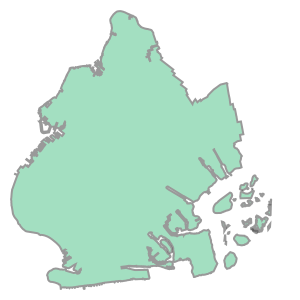

In [5]:
boros.geometry[3]

Load real time bike station data from [CitiBike](http://citibikenyc.com) json API (and from local file if that fails for some reason)

In [6]:
try:
    url = 'http://citibikenyc.com/stations/json'
    f = requests.get(url)
    c = f.json()   
    print("Loaded Citibike data from online source")
except:
    print("Reading cached data")
    c = json.load(open('citibike.json'))
else:
    json.dump(c, open(r'data\citibike.json', 'w'))
    
df = GeoDataFrame(c['stationBeanList'])

Loaded Citibike data from online source


In [7]:
df.columns

Index(['altitude', 'availableBikes', 'availableDocks', 'city', 'id',
       'landMark', 'lastCommunicationTime', 'latitude', 'location',
       'longitude', 'postalCode', 'stAddress1', 'stAddress2', 'stationName',
       'statusKey', 'statusValue', 'testStation', 'totalDocks'],
      dtype='object')

####Prepare data for mapping of citibike stations
- Note there is no geometry information in the dataframe yet, so let's build it.
Shapely is a Python wrapper for GEOS for algebraic manipulation of geometry.
A shapely.geometry.Point has an interior set of exactly one point.
- We add a geometry column to the geodataframe and then choose a projection system (boro data is in feet)
- df.geometry.total_bounds Returns a tuple containing minx, miny, maxx, maxy values for the bounds of the series as a whole
-- all common spatial reference systems have a recognized integer ID called an EPSG code, a simple way to identify a projection.

In [8]:
s = GeoSeries([Point(x, y) for x, y in zip(df['longitude'], df['latitude'])])
df['geometry'] = s
df.crs = {'init': 'epsg:4326', 'no_defs': True}
df.geometry.total_bounds

(-74.01713445, 40.680342422999999, -73.950047975900006, 40.771521999999997)

In [9]:
print(df.geometry.head())

0    POINT (-73.99392888 40.76727216)
1    POINT (-74.00666661 40.71911552)
2    POINT (-74.00016545 40.71117416)
3    POINT (-73.97632328 40.68382604)
4    POINT (-74.00149746 40.74177603)
Name: geometry, dtype: object


To plot these points on the boros map we need to transform the geometries in the df.geometry column to the coordinate reference system use from the boros map, contained in boros.crs 

In [10]:
boros.crs

{'datum': 'NAD83',
 'lat_0': 40.16666666666666,
 'lat_1': 40.66666666666666,
 'lat_2': 41.03333333333333,
 'lon_0': -74,
 'no_defs': True,
 'proj': 'lcc',
 'units': 'us-ft',
 'x_0': 300000,
 'y_0': 0}

In [11]:
df.to_crs(boros.crs, inplace=True)
df.geometry.total_bounds

(979499.5403944857, 187146.60522234702, 998104.68869063177, 220363.19830252684)

In [12]:
print(df.geometry.head())

0    POINT (985931.7065028986 218814.7571059909)
1    POINT (982402.0068864172 201269.7703469703)
2    POINT (984204.1315763244 198376.4207269302)
3    POINT (990816.6931712306 188413.5778061197)
4    POINT (983835.0432398723 209525.6347344019)
Name: geometry, dtype: object


Simple plot of bike stations

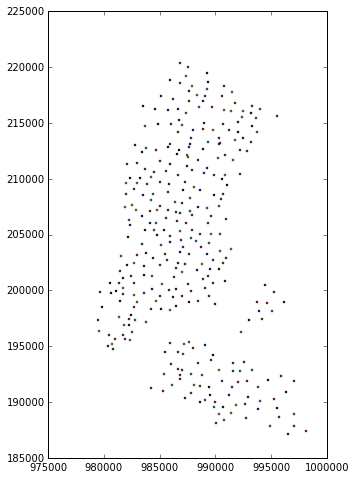

In [13]:
df.plot()

Let's now count the bike stations, bikes, and docks in each boro
- df.geometry.within(manhattan) returns a Series of dtype('bool') with value True if each Point in the df.geometry intersects only with the interior of the geometry that defines manhattan (not its boundary or exterior). In short in_mn will be all points in manhattan.
- Next we sum all availableBikes in Manhattan and Brooklyn

In [14]:
manhattan = boros.geometry[3]
brooklyn = boros.geometry[1]
in_mn = df.geometry.within(manhattan)
in_bk = df.geometry.within(brooklyn)
print( sum(in_mn), 'stations in Manhattan')
print( sum(in_bk), 'stations in Brooklyn')
print()
print( sum(df['availableBikes'][in_mn]), 'available bikes in Manhattan')
print( sum(df['availableBikes'][in_bk]), 'available bikes in Brooklyn')
print()
print( sum(df['availableDocks'][in_mn]), 'available docks in Manhattan')
print( sum(df['availableDocks'][in_bk]), 'available docks in Brooklyn')

77 stations in Manhattan
252 stations in Brooklyn

850 available bikes in Manhattan
2772 available bikes in Brooklyn

1246 available docks in Manhattan
5942 available docks in Brooklyn


####Now some fancier stuff
- .unary_union returns a geometry containing the union of all geometries in the GeoSeries.  A 'multipoint'

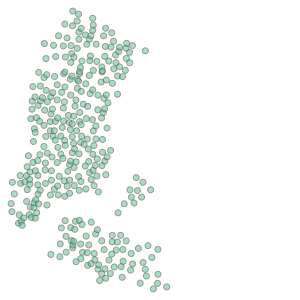

In [15]:
mp = df.geometry.unary_union
mp

Let's plot a buffer around the stations (I'm not following exactly what's going on)

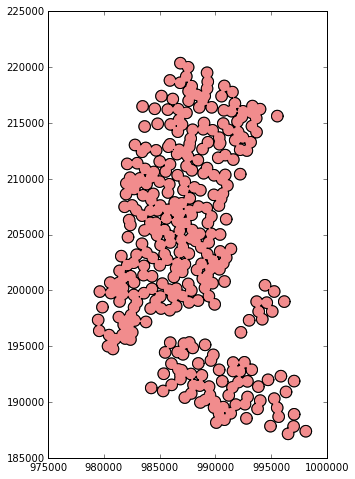

In [16]:
block = 260
geoms = [mp]
contour = mp.buffer(2 * block)
geoms.append(contour)
zones = GeoSeries(geoms)
zones.plot()

Here we plot buffers inside wider buffers

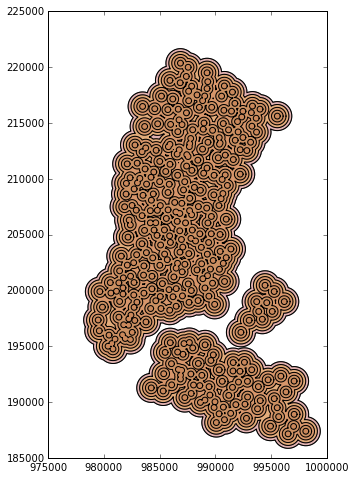

In [17]:
block = 260
geoms = [mp]
for r in range(1, 6):
    contour = mp.buffer(r * block)
    geoms.append(contour)
zones = GeoSeries(geoms)
zones.plot()

Plot this again but inside map boundaries

In [18]:
nyc = boros.geometry.unary_union
nyc

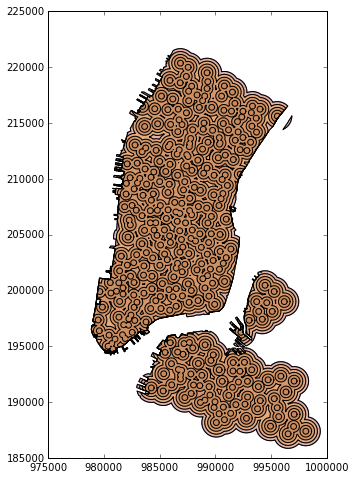

In [19]:
zones.intersection(nyc).plot('Set1')

Load cleaned version of MTA subway station locations from [Steven Romalewski's Spatiality blog](http://spatialityblog.com/2010/07/08/mta-gis-data-update/):

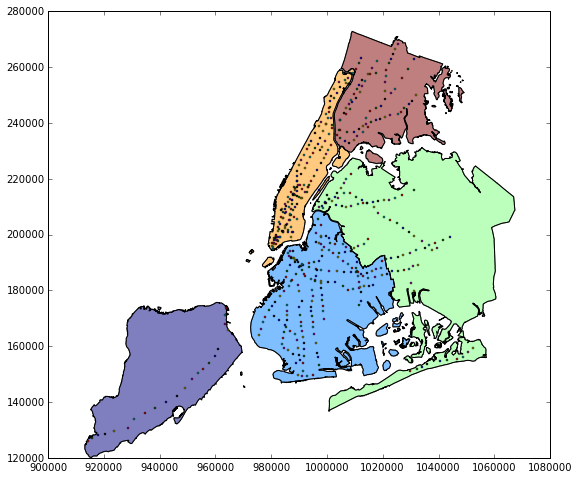

In [20]:
subways = GeoDataFrame.from_file(r'data\nyctsubwaystops_100627_curcleaned.shp')
subways.to_crs(boros.crs, inplace=True)
boros.plot()
ax = subways.plot()

In [21]:
subways['bike_distance'] = subways.geometry.distance(mp)

In [22]:
subways.sort('bike_distance', inplace=True)

#### What subway stations are less than 1 block from a CitiBike station?

In [23]:
len(subways[subways['bike_distance'] < 260])

38

In [24]:
subways.columns

Index(['LOCATION_T', 'NAME_CUR', 'PARENT_STA', 'Routes_ALL', 'Routes_OFF',
       'Routes_WKD', 'STOP_CODE', 'STOP_DESC', 'STOP_ID', 'STOP_LAT',
       'STOP_LON', 'STOP_NAME', 'STOP_URL', 'ZONE_ID', 'geometry',
       'bike_distance'],
      dtype='object')

In [25]:
subways[subways['bike_distance'] < 260][['NAME_CUR','Routes_ALL']]

,NAME_CUR,Routes_ALL
144,51TH STREET,"4, 6, 6X"
64,FULTON STREET,"2, 3"
344,CLASSON AVENUE,G
29,14TH STREET,"1, 2, 3"
25,34TH ST - PENN STA,"1, 2, 3"
264,WEST 4 ST - WASHINGTON SQ,"B, D, F, M"
202,WEST 4 ST - UPPER LEVEL,"A, C, E"
379,UNION SQUARE - 14 STREET,L
468,FRANKLIN - FULTON,FS
33,FRANKLIN STREET,"1, 2"


##Further explorations

### mplleaflet to map ontop of a basemap and add pan/zoom
Uses openstreetmaps.

Not sure why it only gives me the subway stations, and not also the boro boundaries.

In [26]:
mplleaflet.display(fig = ax.figure,crs=boros.crs)